# Clustering of Cancer cells

## Import

In [41]:
import pandas as pd
import numpy as np

import scanpy as sc

In [42]:
ref_path = '/root/datos/maestria/netopaas/lung_scRNA/LUCA_model/hvg_integrated_scvi_scanvi_tumor_model_b128_lay4_h1024_wuSep_epocs300-300/'
surgeries = '/root/datos/maestria/netopaas/luca_explore/surgeries/'
atlas_dir = '/root/datos/maestria/netopaas/luca/data/atlas/'
# The atlas with only tumor primary tissues and uicc stage annotated
id_ = 'extended_tumor_hvg'

In [71]:
ref_latent_base = sc.read(f'{ref_path}/ref_latent.h5ad')

In [72]:
ref_latent = ref_latent_base.copy()
ref_latent.obs = ref_latent.obs[['cell_type', 'batch']]
ref_latent

AnnData object with n_obs × n_vars = 402634 × 10
    obs: 'cell_type', 'batch'
    uns: 'leiden', 'neighbors', 'umap'
    obsm: 'X_umap'
    obsp: 'connectivities', 'distances'

In [73]:
ref_latent.obs

,cell_type,batch
0,T cell CD8 effector memory,Chen_Zhang_2020
1,Tumor cells LUAD,Chen_Zhang_2020
2,B cell,Chen_Zhang_2020
3,B cell,Chen_Zhang_2020
4,Plasma cell,Chen_Zhang_2020
...,...,...
402629,Neutrophils,UKIM-V-2
402630,Neutrophils,UKIM-V-2
402631,Neutrophils,UKIM-V-2
402632,Neutrophils,UKIM-V-2


In [74]:
import h5py
from anndata.experimental import read_elem

with h5py.File(f'{atlas_dir}/{id_}.h5ad', 'r') as f:
  # Check if 'obs' group exists (common for scRNA-seq data)
  if 'obs' in f:
    obs_matrix = read_elem(f['obs'])
  else:
    # Handle the case where 'obs' is not present
    print("obs matrix not found in the h5ad file.")

obs_matrix['uicc_stage'].unique()

['III', 'I', 'IV', 'II', 'III or IV']
Categories (5, object): ['I', 'II', 'III', 'III or IV', 'IV']

In [75]:
ref_latent.obs.index = obs_matrix.index
ref_latent.obs['stage'] = obs_matrix['uicc_stage']
ref_latent.obs['batch'] = obs_matrix['sample']
ref_latent.obs

,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
811511_27-3,Neutrophils,UKIM-V-2_P17_tumor_primary,I
468397_27-3,Neutrophils,UKIM-V-2_P17_tumor_primary,I
115884_27-3,Neutrophils,UKIM-V-2_P17_tumor_primary,I
201201_27-3,Neutrophils,UKIM-V-2_P17_tumor_primary,I


In [76]:
ref_latent.obs['stage'].unique()

['III', 'I', 'IV', 'II', 'III or IV']
Categories (5, object): ['I', 'II', 'III', 'III or IV', 'IV']

## Concatenate

We simply concatenate the scANVI integrated datasets and the do fine clustering of the tumor cells. But may be we consider epithelial cells too

### Zuani

In [151]:
q_pred

,sample,barcode,Source Name,Characteristics[tumor grading],stage,n_counts,n_genes,n_genes_by_counts,total_counts,total_counts_mito,pct_counts_mito,cell_type_tumor,dataset2,_scvi_batch,_scvi_labels
index,,,,,,,,,,,,,,,
Zuani_AAACCCAAGCAACTTC-1,P16_T2,AAACCCAAGCAACTTC-1,P16_T2,T2bN0M0,II,2498.0,1009,1009,2498.0,222.0,8.887110,T cell CD8 activated,Zuani,53,51
Zuani_AAACCCAAGCGCTTCG-1,P16_T2,AAACCCAAGCGCTTCG-1,P16_T2,T2bN0M0,II,1586.0,800,800,1586.0,182.0,11.475409,T cell CD8 activated,Zuani,53,51
Zuani_AAACCCAAGGCTAACG-1,P16_T2,AAACCCAAGGCTAACG-1,P16_T2,T2bN0M0,II,4772.0,1754,1754,4772.0,107.0,2.242246,T cell CD8 activated,Zuani,53,51
Zuani_AAACCCACATAGGTTC-1,P16_T2,AAACCCACATAGGTTC-1,P16_T2,T2bN0M0,II,5139.0,1662,1662,5139.0,119.0,2.315626,T cell CD4,Zuani,53,51
Zuani_AAACCCACATCCTTGC-1,P16_T2,AAACCCACATCCTTGC-1,P16_T2,T2bN0M0,II,1666.0,713,713,1666.0,164.0,9.843937,T cell CD8 activated,Zuani,53,51
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zuani_TTTGATCAGTTGAATG-1,P20_T2,TTTGATCAGTTGAATG-1,P20_T2,T4N2M0,III,28995.0,2657,2657,28995.0,499.0,1.720986,Plasma cell,Zuani,53,51
Zuani_TTTGATCGTCAGCTTA-1,P20_T2,TTTGATCGTCAGCTTA-1,P20_T2,T4N2M0,III,8029.0,2397,2397,8029.0,250.0,3.113713,Monocyte classical,Zuani,53,51
Zuani_TTTGGAGGTCACCCTT-1,P20_T2,TTTGGAGGTCACCCTT-1,P20_T2,T4N2M0,III,26494.0,5149,5149,26494.0,948.0,3.578169,transitional club/AT2,Zuani,53,51


In [150]:
name = 'Zuani_wu'
name_short = name.split('_')[0]
q_latent = sc.read(f'{surgeries}/{name}/query_latent.h5ad')
q_pred = pd.read_csv(f'{surgeries}/{name}_predicted.csv', index_col=0)
# q_pred.index = q_pred.index.astype(str) + f'_{name}'
q_latent.obs = q_pred.loc[:,['cell_type_tumor', 'sample', 'stage']].rename(columns={'cell_type_tumor':'cell_type', 'sample':'batch'})
q_latent.obs

,cell_type,batch,stage
index,,,
Zuani_AAACCCAAGCAACTTC-1,T cell CD8 activated,P16_T2,II
Zuani_AAACCCAAGCGCTTCG-1,T cell CD8 activated,P16_T2,II
Zuani_AAACCCAAGGCTAACG-1,T cell CD8 activated,P16_T2,II
Zuani_AAACCCACATAGGTTC-1,T cell CD4,P16_T2,II
Zuani_AAACCCACATCCTTGC-1,T cell CD8 activated,P16_T2,II
...,...,...,...
Zuani_TTTGATCAGTTGAATG-1,Plasma cell,P20_T2,III
Zuani_TTTGATCGTCAGCTTA-1,Monocyte classical,P20_T2,III
Zuani_TTTGGAGGTCACCCTT-1,transitional club/AT2,P20_T2,III


In [152]:
ref_latent.obs[ref_latent.obs['dataset2']=='Zuani']

,cell_type,batch,stage,dataset,dataset2
Zuani_AAACCCAAGCAACTTC-1,T cell CD8 activated,P16_T2_Zuani,II,Zuani,Zuani
Zuani_AAACCCAAGCGCTTCG-1,T cell CD8 activated,P16_T2_Zuani,II,Zuani,Zuani
Zuani_AAACCCAAGGCTAACG-1,T cell CD8 activated,P16_T2_Zuani,II,Zuani,Zuani
Zuani_AAACCCACATAGGTTC-1,T cell CD4,P16_T2_Zuani,II,Zuani,Zuani
Zuani_AAACCCACATCCTTGC-1,T cell CD8 activated,P16_T2_Zuani,II,Zuani,Zuani
...,...,...,...,...,...
Zuani_TTTGATCAGTTGAATG-1,Plasma cell,P20_T2_Zuani,III,Zuani,Zuani
Zuani_TTTGATCGTCAGCTTA-1,Monocyte classical,P20_T2_Zuani,III,Zuani,Zuani
Zuani_TTTGGAGGTCACCCTT-1,transitional club/AT2,P20_T2_Zuani,III,Zuani,Zuani
Zuani_TTTGTTGAGTATGGAT-1,Tumor cells LUAD EMT,P20_T2_Zuani,III,Zuani,Zuani


In [78]:
q_latent.obs.groupby(['stage']).size()

stage
I        3431
II     182402
III     35033
dtype: int64

In [79]:
ref_latent = ref_latent.concatenate(q_latent,batch_key=None, index_unique=None)
ref_latent.obs

/tmp/ipykernel_2217367/1445844273.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ref_latent = ref_latent.concatenate(q_latent,batch_key=None, index_unique=None)


,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
Zuani_TTTGATCAGTTGAATG-1,Plasma cell,P20_T2,III
Zuani_TTTGATCGTCAGCTTA-1,Monocyte classical,P20_T2,III
Zuani_TTTGGAGGTCACCCTT-1,transitional club/AT2,P20_T2,III
Zuani_TTTGTTGAGTATGGAT-1,Tumor cells LUAD EMT,P20_T2,III


IF THE BATCH IS AT SAMPLE LEVEL WE ADD THE DATASET TO NO LOSE THAT INFO

In [80]:
filt = ref_latent.obs.index.str.contains(name_short)
ref_latent.obs.loc[filt, 'batch'] += f'_{name_short}'
ref_latent.obs

,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
Zuani_TTTGATCAGTTGAATG-1,Plasma cell,P20_T2_Zuani,III
Zuani_TTTGATCGTCAGCTTA-1,Monocyte classical,P20_T2_Zuani,III
Zuani_TTTGGAGGTCACCCTT-1,transitional club/AT2,P20_T2_Zuani,III
Zuani_TTTGTTGAGTATGGAT-1,Tumor cells LUAD EMT,P20_T2_Zuani,III


### Bischoff

In [81]:
name = 'Bishoff_wu'
name_short = name.split('_')[0]
q_latent = sc.read(f'{surgeries}/{name}/query_latent.h5ad')
q_pred = pd.read_csv(f'{surgeries}/{name}_predicted.csv')
q_pred.set_index(['index'], inplace=True)
# q_pred.index = q_pred.index.astype(str) + f'_{name}'
q_latent.obs = q_pred.loc[:,['cell_type_tumor', 'sample']].rename(columns={'cell_type_tumor':'cell_type', 'sample':'batch'})
q_latent.obs['stage'] = 'III or IV'
q_latent.obs

,cell_type,batch,stage
index,,,
Bishoff_0,T cell CD4,p033t,III or IV
Bishoff_1,T cell CD8 activated,p033t,III or IV
Bishoff_2,Tumor cells NSCLC mixed,p033t,III or IV
Bishoff_3,T cell CD8 effector memory,p033t,III or IV
Bishoff_4,Plasma cell,p033t,III or IV
...,...,...,...
Bishoff_11615,Tumor cells LUAD,p019t,III or IV
Bishoff_11616,Tumor cells LUAD,p019t,III or IV
Bishoff_11617,T cell regulatory,p019t,III or IV


In [82]:
print(q_latent.obs['stage'].unique())

['III or IV']


In [83]:
ref_latent = ref_latent.concatenate(q_latent,batch_key=None, index_unique=None)
ref_latent.obs

/tmp/ipykernel_2217367/1445844273.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ref_latent = ref_latent.concatenate(q_latent,batch_key=None, index_unique=None)


,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
Bishoff_11615,Tumor cells LUAD,p019t,III or IV
Bishoff_11616,Tumor cells LUAD,p019t,III or IV
Bishoff_11617,T cell regulatory,p019t,III or IV
Bishoff_11618,T cell CD8 effector memory,p019t,III or IV


IF THE BATCH IS AT SAMPLE LEVEL WE ADD THE DATASET TO NO LOSE THAT INFO

In [84]:
filt = ref_latent.obs.index.str.contains(name_short)
ref_latent.obs.loc[filt, 'batch'] += f'_{name_short}'
ref_latent.obs

,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
Bishoff_11615,Tumor cells LUAD,p019t_Bishoff,III or IV
Bishoff_11616,Tumor cells LUAD,p019t_Bishoff,III or IV
Bishoff_11617,T cell regulatory,p019t_Bishoff,III or IV
Bishoff_11618,T cell CD8 effector memory,p019t_Bishoff,III or IV


### Deng

In [203]:
name = 'Deng_wu'
name_short = name.split('_')[0]
q_latent = sc.read(f'{surgeries}/{name}/query_latent.h5ad')
q_pred = pd.read_csv(f'{surgeries}/{name}_predicted.csv')
q_pred.set_index(['index'], inplace=True)
# q_pred.index = q_pred.index.astype(str) + f'_{name}'

q_pred['stage'] = q_pred['Pathological stage']
q_pred['stage'] = q_pred['stage'].str.replace(r'^IA[1-3]$|^IB$', 'I', regex=True)
q_pred['stage'] = q_pred['stage'].str.replace('IIB', 'II')
q_pred['stage'] = q_pred['stage'].str.replace(r'^III[AB]$', 'III', regex=True)

q_latent.obs = q_pred.loc[:,['cell_type_tumor', 'dataset', 'stage']].rename(columns={'cell_type_tumor':'cell_type', 'dataset':'batch'})

q_latent.obs

,cell_type,batch,stage
index,,,
Deng_0,Mast cell,P001,I
Deng_1,T cell CD8 effector memory,P001,I
Deng_2,T cell CD8 activated,P001,I
Deng_3,T cell CD8 activated,P001,I
Deng_4,Mast cell,P001,I
...,...,...,...
Deng_421706,T cell CD4,P049,III
Deng_421707,Plasma cell,P049,III
Deng_421708,B cell,P049,III


In [204]:
print(q_latent.obs['stage'].unique())

['I' 'II' 'III']


In [87]:
ref_latent = ref_latent.concatenate(q_latent,batch_key=None, index_unique=None)
ref_latent.obs

/tmp/ipykernel_2217367/1445844273.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ref_latent = ref_latent.concatenate(q_latent,batch_key=None, index_unique=None)


,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
Deng_421706,T cell CD4,P049,III
Deng_421707,Plasma cell,P049,III
Deng_421708,B cell,P049,III
Deng_421709,T cell CD8 activated,P049,III


IF THE BATCH IS AT SAMPLE LEVEL WE ADD THE DATASET TO NO LOSE THAT INFO

In [88]:
filt = ref_latent.obs.index.str.contains(name_short)
ref_latent.obs.loc[filt, 'batch'] += f'_{name_short}'
ref_latent.obs

,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
Deng_421706,T cell CD4,P049_Deng,III
Deng_421707,Plasma cell,P049_Deng,III
Deng_421708,B cell,P049_Deng,III
Deng_421709,T cell CD8 activated,P049_Deng,III


### Hu

In [89]:
name = 'Hu_wu'
name_short = name.split('_')[0]
q_latent = sc.read(f'{surgeries}/{name}/query_latent.h5ad')
q_pred = pd.read_csv(f'{surgeries}/{name}_predicted.csv')
q_pred.set_index(['index'], inplace=True)
# q_pred.index = q_pred.index.astype(str) + f'_{name}'

q_pred['stage'] = q_pred['Clinical Stage']
q_pred['stage'] = q_pred['stage'].str.replace('IIIA', 'III')

q_latent.obs = q_pred.loc[:,['cell_type_tumor', 'Sample','stage']].rename(columns={'cell_type_tumor':'cell_type', 'Sample':'batch'})
q_latent.obs
# print(q_latent.obs['stage'].unique())

,cell_type,batch,stage
index,,,
Hu_BD_immune01_612637,Tumor cells LUSC mitotic,BD_immune01,III
Hu_BD_immune01_698718,Tumor cells LUSC mitotic,BD_immune01,III
Hu_BD_immune01_509246,Tumor cells LUSC mitotic,BD_immune01,III
Hu_BD_immune01_101435,Tumor cells LUSC mitotic,BD_immune01,III
Hu_BD_immune01_400370,T cell CD8 dividing,BD_immune01,III
...,...,...,...
Hu_BD_immune13_111313,T cell CD8 dividing,BD_immune13,III
Hu_BD_immune13_791956,T cell CD4 dividing,BD_immune13,III
Hu_BD_immune14_462072,B cell dividing,BD_immune14,III


In [90]:
ref_latent = ref_latent.concatenate(q_latent,batch_key=None, index_unique=None)
ref_latent.obs

/tmp/ipykernel_2217367/1445844273.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  ref_latent = ref_latent.concatenate(q_latent,batch_key=None, index_unique=None)


,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
Hu_BD_immune13_111313,T cell CD8 dividing,BD_immune13,III
Hu_BD_immune13_791956,T cell CD4 dividing,BD_immune13,III
Hu_BD_immune14_462072,B cell dividing,BD_immune14,III
Hu_BD_immune14_124095,T cell CD4 dividing,BD_immune14,III


IF THE BATCH IS AT SAMPLE LEVEL WE ADD THE DATASET TO NO LOSE THAT INFO

In [91]:
filt = ref_latent.obs.index.str.contains(name_short)
ref_latent.obs.loc[filt, 'batch'] += f'_{name_short}'
ref_latent.obs

,cell_type,batch,stage
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III
...,...,...,...
Hu_BD_immune13_111313,T cell CD8 dividing,BD_immune13_Hu,III
Hu_BD_immune13_791956,T cell CD4 dividing,BD_immune13_Hu,III
Hu_BD_immune14_462072,B cell dividing,BD_immune14_Hu,III
Hu_BD_immune14_124095,T cell CD4 dividing,BD_immune14_Hu,III


## Subset

In [92]:
ref_latent.obs.cell_type.unique()

array(['T cell CD8 effector memory', 'Tumor cells LUAD', 'B cell',
       'Plasma cell', 'T cell regulatory', 'Plasma cell dividing',
       'T cell CD8 dividing', 'Mast cell', 'T cell NK-like', 'T cell CD4',
       'Macrophage', 'T cell CD8 terminally exhausted',
       'Alveolar cell type 2', 'NK cell', 'Monocyte classical',
       'Neutrophils', 'T cell CD8 naive', 'cDC2', 'Macrophage alveolar',
       'Tumor cells LUAD mitotic', 'transitional club/AT2',
       'T cell CD4 dividing', 'Alveolar cell type 1', 'pDC',
       'NK cell dividing', 'Tumor cells LUSC mitotic', 'Ciliated',
       'Endothelial cell capillary', 'T cell CD8 activated',
       'B cell dividing', 'Endothelial cell venous', 'cDC1',
       'myeloid dividing', 'Club', 'Monocyte non-classical',
       'ROS1+ healthy epithelial', 'stromal dividing', 'DC mature',
       'Fibroblast alveolar', 'Fibroblast peribronchial',
       'Tumor cells LUSC', 'Smooth muscle cell', 'Pericyte',
       'Fibroblast adventitial', 'Tumor 

In [239]:
ref_latent.obs['dataset'] = ref_latent.obs['batch']

filt = ref_latent.obs.index.str.contains('Hu')
ref_latent.obs.loc[filt, 'dataset'] = 'Hu'

filt = ref_latent.obs.index.str.contains('Deng')
ref_latent.obs.loc[filt, 'dataset'] = 'Deng'

filt = ref_latent.obs.index.str.contains('Bishoff')
ref_latent.obs.loc[filt, 'dataset'] = 'Bishoff'
ref_latent.obs

filt = ref_latent.obs.index.str.contains('Zuani')
ref_latent.obs.loc[filt, 'dataset'] = 'Zuani'
ref_latent.obs

,cell_type,batch,stage,dataset
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10
...,...,...,...,...
Hu_BD_immune13_111313,T cell CD8 dividing,BD_immune13_Hu,III,Hu
Hu_BD_immune13_791956,T cell CD4 dividing,BD_immune13_Hu,III,Hu
Hu_BD_immune14_462072,B cell dividing,BD_immune14_Hu,III,Hu
Hu_BD_immune14_124095,T cell CD4 dividing,BD_immune14_Hu,III,Hu


We wanna get all the cells that could be related to the neoplastic cells. That means epithelial derived. Manually selectign from the cell types above we arrive to:

### Import

In [240]:
subc_dir = 'Subcluster_wu'

In [241]:
! mkdir $surgeries/$subc_dir

mkdir: cannot create directory ‘/root/datos/maestria/netopaas/luca_explore/surgeries//Subcluster_wu’: File exists


In [49]:
# ref_latent.write_h5ad(f'{surgeries}/{subc_dir}/query_latent.h5ad')

ref_latent = sc.read(f'{surgeries}/{subc_dir}/query_latent.h5ad')

In [243]:
epit_types = ['Alveolar cell type 1', 'Alveolar cell type 2',  'ROS1+ healthy epithelial', 'transitional club/AT2', 'Club', 'Ciliated']
epit_tumor_filter = np.logical_or(ref_latent.obs.cell_type.isin(epit_types), ref_latent.obs.cell_type.str.contains('Tumor'))
ref_latent_tumor = ref_latent[epit_tumor_filter]

In [244]:
ref_latent_tumor.write_h5ad(f'{surgeries}/{subc_dir}/query_latent_tumor.h5ad')

# ref_latent_tumor = sc.read(f'{surgeries}/Subcluster/query_latent_tumor.h5ad')

In [29]:
ref_latent_tumor_early= sc.read_h5ad(f'{surgeries}/{subc_dir}/query_latent_tumor_early.h5ad')
ref_latent_tumor_late= sc.read_h5ad(f'{surgeries}/{subc_dir}/query_latent_tumor_late.h5ad')

# late_filter = ref_latent_tumor.obs['stage'].isin(['III', 'IV', 'III-IV', 'III or IV'])
# early_filter = np.logical_not(late_filter)

# ref_latent_tumor_late = ref_latent_tumor[late_filter]
# ref_latent_tumor_early = ref_latent_tumor[early_filter]

# ref_latent_tumor_early.write_h5ad(f'{surgeries}/{subc_dir}/query_latent_tumor_early.h5ad')
# ref_latent_tumor_late.write_h5ad(f'{surgeries}/{subc_dir}/query_latent_tumor_late.h5ad')

In [246]:
ref_latent_tumor_early.obs.cell_type.unique()

['Tumor cells LUAD mitotic', 'transitional club/AT2', 'Tumor cells LUAD EMT', 'Tumor cells LUAD', 'Ciliated', ..., 'Tumor cells LUSC mitotic', 'ROS1+ healthy epithelial', 'Tumor cells LUAD NE', 'Tumor cells NSCLC mixed', 'Tumor cells LUAD MSLN']
Length: 14
Categories (14, object): ['Alveolar cell type 1', 'Alveolar cell type 2', 'Ciliated', 'Club', ..., 'Tumor cells LUSC', 'Tumor cells LUSC mitotic', 'Tumor cells NSCLC mixed', 'transitional club/AT2']

## Tumor early

In [205]:
import json
time = 'early'
ref_latent_tumor = ref_latent_tumor_late if time == 'late' else ref_latent_tumor_early
ref_latent_tumor

AnnData object with n_obs × n_vars = 116045 × 10
    obs: 'cell_type', 'batch', 'stage', 'dataset'

In [206]:
ref_latent_tumor.obs.loc['Deng_365957',:]

cell_type    Tumor cells LUAD
batch               P043_Deng
stage                      II
dataset                  Deng
Name: Deng_365957, dtype: object

### Calculate UMAP (local)

In [32]:
ref_latent_tumor.obs

,cell_type,batch,stage,dataset
AATCCAGTCACTTCAT-1_1-1,Tumor cells LUAD mitotic,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
AATCCAGTCATATCGG-1_1-1,transitional club/AT2,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
ACAGCCGCAGTTCCCT-1_1-1,Tumor cells LUAD EMT,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
AGCATACCACAACGCC-1_1-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
AGCGGTCAGGTGATTA-1_1-1,Tumor cells LUAD mitotic,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
...,...,...,...,...
Deng_365837,Tumor cells LUAD,P043_Deng,II,Deng
Deng_365862,Tumor cells LUAD,P043_Deng,II,Deng
Deng_365937,Tumor cells LUAD,P043_Deng,II,Deng
Deng_365947,transitional club/AT2,P043_Deng,II,Deng


In [248]:
import numba
numba.set_num_threads(8)

sc.pp.neighbors(ref_latent_tumor,
                # n_pcs=30
               )
sc.tl.umap(ref_latent_tumor)

In [249]:
sc.tl.leiden(ref_latent_tumor, key_added="leiden", resolution=0.25)

### Calculate UMAP (faiss)

The steps here can be done with the `faiss_cluster.py` script for much faster NN and clustering accelerated by GPU.

Run `modal run faiss_cluster.py` in this folder to get all the neccesary files.

In [8]:
leiden_nums = pd.read_csv(f'{surgeries}/{subc_dir}/atlas_{time}_leiden.csv', index_col=0)
umap_embed = pd.read_csv(f'{surgeries}/{subc_dir}/atlas_{time}_umap.csv', index_col=0)
uparams  = json.load(open(f'{surgeries}/{subc_dir}/atlas_{time}_uparams.json'))

ref_latent_tumor.obs['leiden'] = leiden_nums.loc[ref_latent_tumor.obs.index, 'leiden']
ref_latent_tumor.obs['leiden'] = ref_latent_tumor.obs['leiden'].astype('category')
umap_embed.index = ref_latent_tumor.obs.index
ref_latent_tumor.obsm['X_umap'] = umap_embed.to_numpy()
ref_latent_tumor.uns['umap'] = uparams
uparams

{'n_neighbors': 30,
 'n_components': 2,
 'min_dist': 0.05,
 'spread': 0.8,
 'random_state': 42,
 'method': 'cuml-umap',
 'leiden_resol': 0.7}

### Paint UMAP

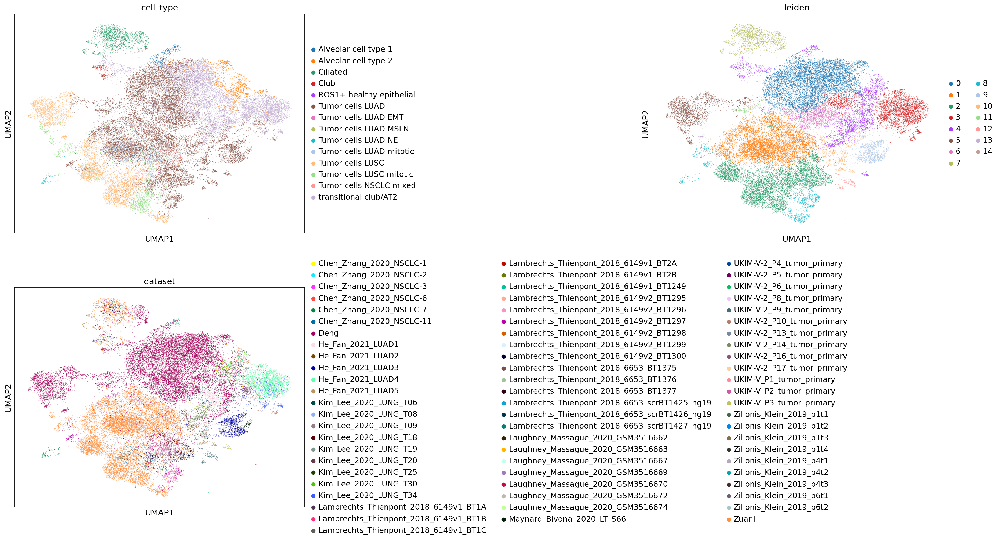

In [250]:
sc.set_figure_params(figsize=[7,7])
sc.pl.umap(ref_latent_tumor, ncols=2,color=['cell_type', 'leiden', 'dataset'], wspace=1, frameon=True)

### Contingency

In [272]:
import anndata as ad
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `adata` is your AnnData object and the two obs columns are 'col1' and 'col2'
# Replace 'col1' and 'col2' with your actual column names
col1 = 'leiden'
col2 = 'cell_type'

# Extract the two columns from the obs dataframe
labels1 = ref_latent_tumor.obs[col1]
labels2 = ref_latent_tumor.obs[col2]

contingency_table = pd.crosstab(labels1, labels2)
# Normalize the table to get percentages
contingency_table_percentage = contingency_table.div(contingency_table.sum(axis=1), axis=0) * 100

contingency_table_T = contingency_table.T
contingency_table_percentage_T = contingency_table_T.div(contingency_table_T.sum(axis=1), axis=0) * 100


Text(0.5, 1.0, '% of Cells in Annotated Cell Type')

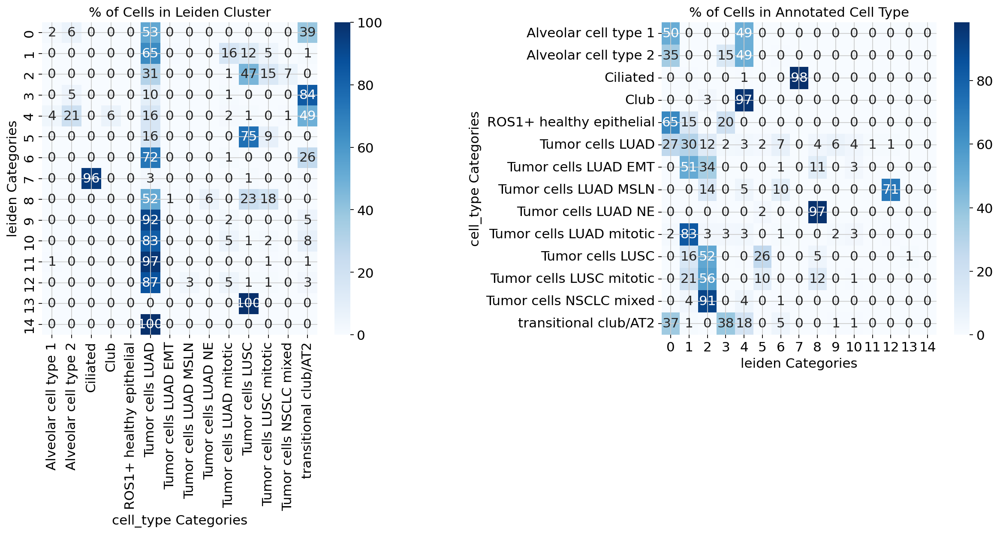

In [273]:
# Visualize the matrix using seaborn
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
plt.subplots_adjust(wspace=0.8)

sns.heatmap(contingency_table_percentage, annot=True, fmt='.0f', cmap='Blues', ax=ax1)
ax1.set_xlabel(f'{col2} Categories')
ax1.set_ylabel(f'{col1} Categories')
ax1.set_title('% of Cells in Leiden Cluster')

sns.heatmap(contingency_table_percentage_T, annot=True, fmt='.0f', cmap='Blues', ax=ax2)
ax2.set_xlabel(f'{col1} Categories')
ax2.set_ylabel(f'{col2} Categories')
ax2.set_title('% of Cells in Annotated Cell Type')

### Map Leiden number to cell type

In [237]:
leiden_mapping = {
    0: 'Tumor LUAD_Club_AT2/1', 
    1: 'Tumor LUAD_mitotic', # Has a ver low percentage of LUAD but the confusion is tractable
    2: 'Tumor LUSC_LUAD_mitotic',
    3: 'Club_AT2/1_high',
    4: 'Tumor Club_AT2_LUAD',
    5: 'Tumor LUSC_LUAD_mitotic',
    6: 'Tumor LUAD_Club_AT2', # has not that much just NSCLC
    7: 'Ciliated', # Club are basal cells so maybe this makes some sense
    8: 'Tumor LUAD_NE_LUSC',
    9: 'Tumor LUAD_mitotic',
    10:'Tumor LUAD_NE_mitotic',
    11:'Tumor LUAD_AT1/2',
    12:'Tumor LUAD_MSLN',
    13:'Tumor LUSC',
    14:'Tumor LUAD',
}

with open(f'{surgeries}/{subc_dir}/mapping_{time}_leiden.json', 'w') as fp:
        json.dump(leiden_mapping, fp)

## Tumor late

In [281]:
import json
time = 'late'
ref_latent_tumor = ref_latent_tumor_late if time == 'late' else ref_latent_tumor_early
ref_latent_tumor

AnnData object with n_obs × n_vars = 81730 × 10
    obs: 'cell_type', 'batch', 'stage', 'dataset', 'leiden_local', 'leiden'
    uns: 'neighbors', 'umap', 'leiden_local', 'leiden', 'cell_type_colors', 'leiden_colors', 'dataset_colors', 'batch_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

### Calculate UMAP (local)

In [254]:
sc.pp.neighbors(ref_latent_tumor,
                # n_pcs=30
               )
sc.tl.umap(ref_latent_tumor)

In [255]:
sc.tl.leiden(ref_latent_tumor, key_added="leiden_local", resolution=0.25)

In [256]:
ref_latent_tumor.obs['leiden'] = ref_latent_tumor.obs['leiden_local']
ref_latent_tumor.uns['leiden'] = ref_latent_tumor.uns['leiden_local']

### Calculate UMAP (faiss)

The steps here can be done with the `faiss_cluster.py` script for much faster NN and clustering accelerated by GPU.

Run `modal run faiss_cluster.py` in this folder to get all the neccesary files.

In [349]:
leiden_nums = pd.read_csv(f'{surgeries}/Subcluster/atlas_{time}_leiden.csv', index_col=0)
umap_embed = pd.read_csv(f'{surgeries}/Subcluster/atlas_{time}_umap.csv', index_col=0)
uparams  = json.load(open(f'{surgeries}/Subcluster/atlas_{time}_uparams.json'))

ref_latent_tumor.obs['leiden'] = leiden_nums.loc[ref_latent_tumor.obs.index, 'leiden']
ref_latent_tumor.obs['leiden'] = ref_latent_tumor.obs['leiden'].astype('category')
umap_embed.index = ref_latent_tumor.obs.index
ref_latent_tumor.obsm['X_umap2'] = umap_embed.to_numpy()
ref_latent_tumor.uns['umap'] = uparams
uparams

/tmp/ipykernel_466716/96672343.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ref_latent_tumor.obs['leiden'] = leiden_nums.loc[ref_latent_tumor.obs.index, 'leiden']


{'n_neighbors': 30,
 'n_components': 2,
 'min_dist': 0.03,
 'spread': 0.6,
 'random_state': 42,
 'method': 'cuml-umap',
 'leiden_resol': 0.5}

### Paint UMAP

Wu_Zhou is very seprated i think the batch effect correction may not have worked for it

#### Local

These samples are the ones that are the most separated, though when looking at their distribution in the actual paper it makes sense because P07 is the most abundant in cancer cells and was not respondant to immune therapy:

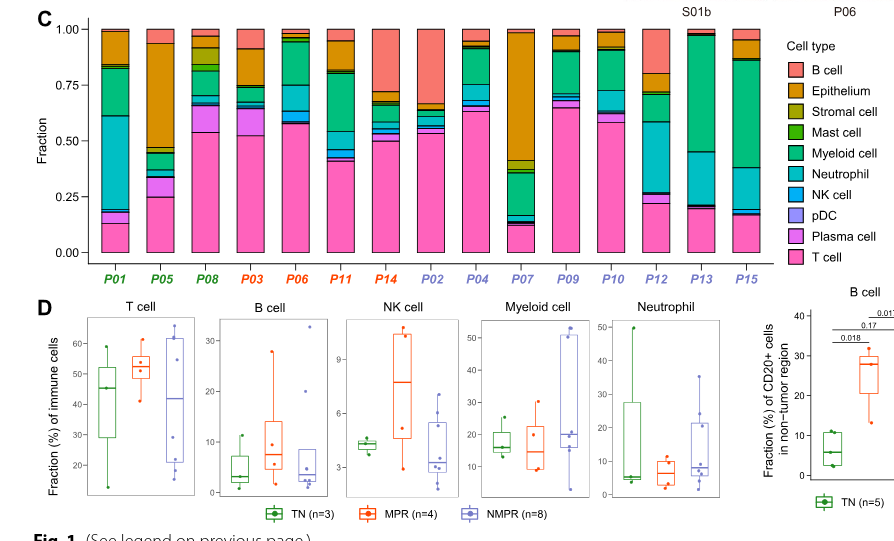

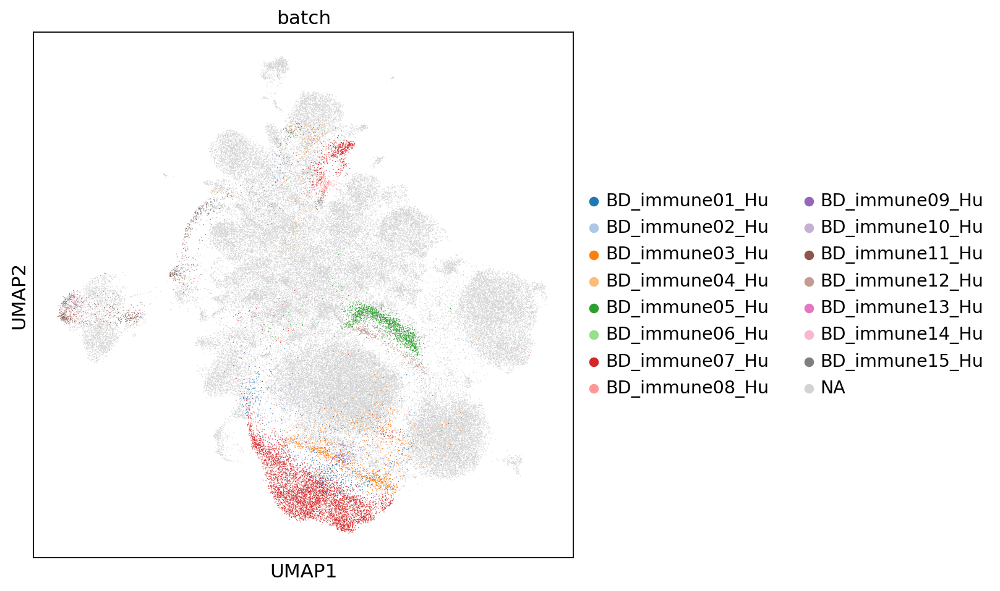

In [290]:
sc.pl.umap(ref_latent_tumor, color=['batch'], groups=ref_latent_tumor.obs['batch'][ref_latent_tumor.obs['batch'].str.contains('Hu')].unique())

The separation of the Wu Zhou samples is no longer as exalted so we may be able to expect more interactions for the tumor cells.

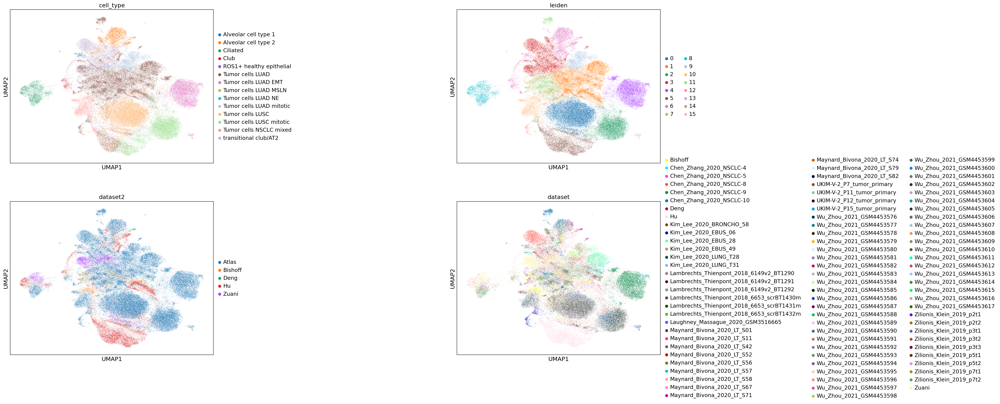

In [287]:
ref_latent_tumor.obs['dataset2'] = ref_latent.obs.loc[ref_latent_tumor.obs.index, 'dataset2']
sc.set_figure_params(figsize=[7,7])
sc.pl.umap(ref_latent_tumor, ncols=2,color=['cell_type', 'leiden', 'dataset2','dataset'], wspace=1,)

Chen Zhang seems to have mostly Tumor cells LUAD EMT. This does coincide with the original atlas annotation in LUCA.
We can confimr that Wu Zhou is no longer very seprated.

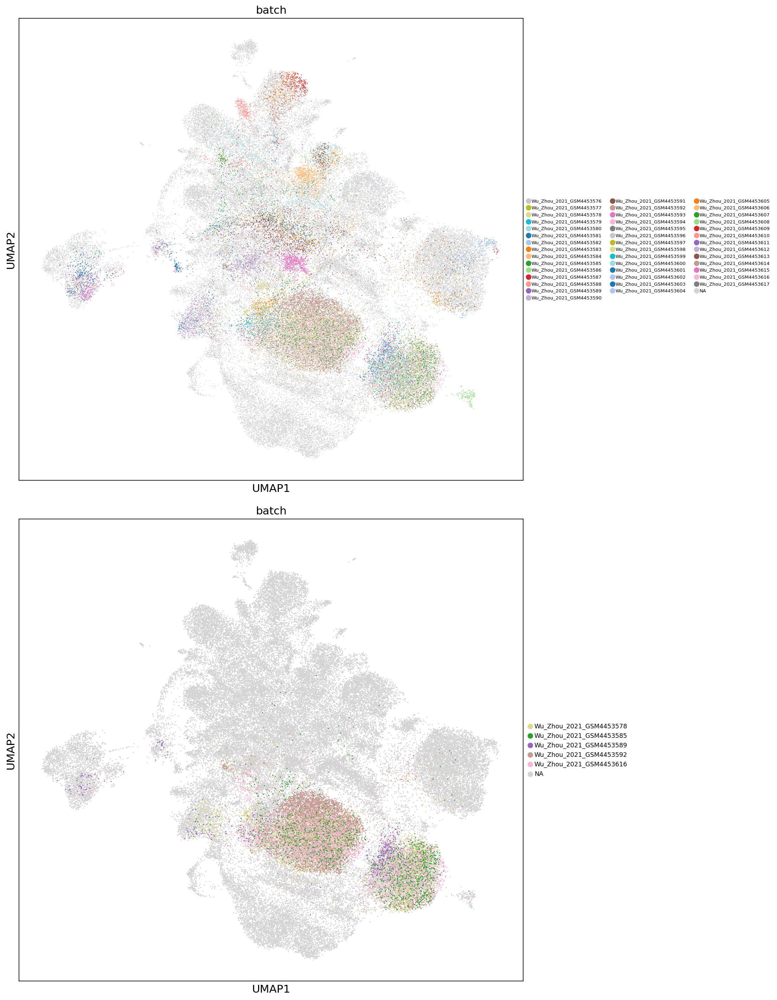

In [292]:
import seaborn as sns

grs1 = [ gr for gr in ref_latent_tumor.obs['batch'].unique() if 'Wu' in gr]
grs2 = ['Wu_Zhou_2021_GSM4453585', 'Wu_Zhou_2021_GSM4453616', 'Wu_Zhou_2021_GSM4453589',
         'Wu_Zhou_2021_GSM4453578', 'Wu_Zhou_2021_GSM4453592']

# del ref_latent_tumor.uns['batch_colors']
colors = sns.color_palette("tab20", n_colors=len(grs1))

fig, axs = plt.subplots(2, 1, figsize=(14,18))

sc.pl.umap(
    ref_latent_tumor,
    color='batch',
    groups=grs1,
    palette=colors,
    ax=axs[0],
    show=False,
    legend_fontsize=6,
    size=4
)

sc.pl.umap(
    ref_latent_tumor,
    color='batch',
    groups=grs2,
    palette=colors,
    ax=axs[1],
    show=False,
    legend_fontsize=8,
    size=8
)

fig.tight_layout()
fig.show()


### Contingency

In [293]:
import anndata as ad
import numpy as np
import pandas as pd
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `adata` is your AnnData object and the two obs columns are 'col1' and 'col2'
# Replace 'col1' and 'col2' with your actual column names
col1 = 'leiden'
col2 = 'cell_type'

# Extract the two columns from the obs dataframe
labels1 = ref_latent_tumor.obs[col1]
labels2 = ref_latent_tumor.obs[col2]

contingency_table = pd.crosstab(labels1, labels2)
# Normalize the table to get percentages
contingency_table_percentage = contingency_table.div(contingency_table.sum(axis=1), axis=0) * 100

contingency_table_T = contingency_table.T
contingency_table_percentage_T = contingency_table_T.div(contingency_table_T.sum(axis=1), axis=0) * 100


Text(0.5, 1.0, '% of Cells in Annotated Cell Type')

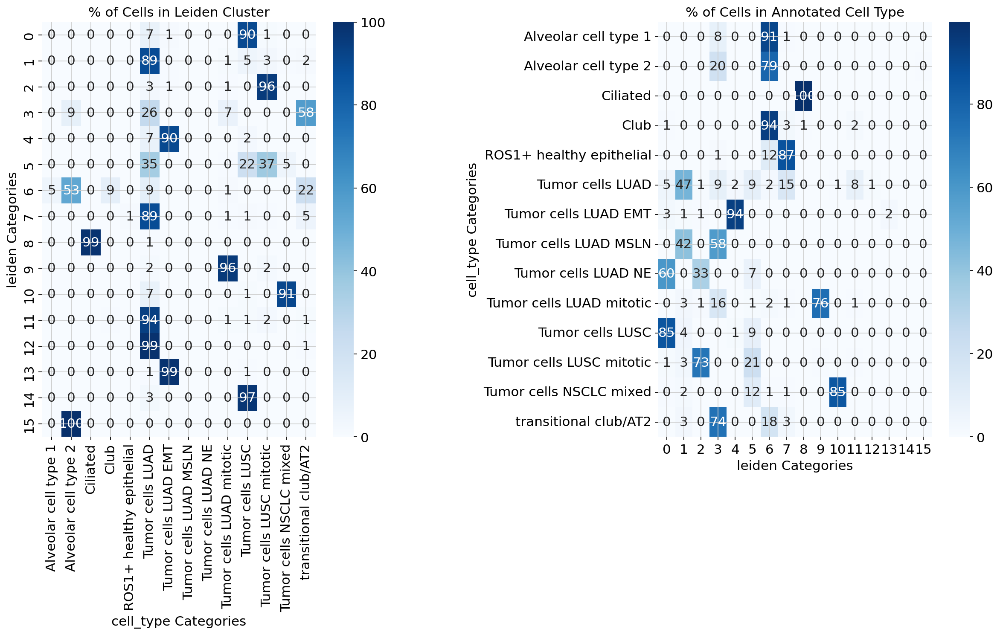

In [294]:
# Visualize the matrix using seaborn
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))
plt.subplots_adjust(wspace=0.8)

sns.heatmap(contingency_table_percentage, annot=True, fmt='.0f', cmap='Blues', ax=ax1)
ax1.set_xlabel(f'{col2} Categories')
ax1.set_ylabel(f'{col1} Categories')
ax1.set_title('% of Cells in Leiden Cluster')

sns.heatmap(contingency_table_percentage_T, annot=True, fmt='.0f', cmap='Blues', ax=ax2)
ax2.set_xlabel(f'{col1} Categories')
ax2.set_ylabel(f'{col2} Categories')
ax2.set_title('% of Cells in Annotated Cell Type')

### Map Leiden number to cell type

In [295]:
leiden_mapping = {
    0: 'Tumor LUSC_LUAD_NE',
    1: 'Tumor LUAD_MSLN_LUSC',
    2: 'Tumor LUSC_mitotic_NE',
    3: 'Tumor Club/AT2_MSLN',
    4: 'Tumor LUAD_EMT',
    5: 'Tumor LUAD_LUSC_mitotic',
    6: 'Tumor AT2/1_LUAD', # has not that much just NSCLC
    7: 'Tumor LUAD_ROS1+', # These are mostly isolated but we would like ti to be more mixed to have more interactions
    8: 'Ciliated',
    9: 'Tumor LUAD_mitotic',
    10:'Tumor NSCLC_mixed',
    11:'Tumor LUAD_mitotic',
    12:'Tumor LUAD2',
    13:'Tumor LUAD_EMT',
    14:'Tumor LUSC', # This is not that good and like with ROS1+.... our clustering is competing agianst our neural network and the NN should win
    15:'AT2',
}

with open(f'{surgeries}/{subc_dir}/mapping_{time}_leiden.json', 'w') as fp:
    json.dump(leiden_mapping, fp)

## Export new annots for each dataset

In [296]:
ref_latent_tumor.obs['leiden_adjusted'] = ref_latent_tumor.obs['leiden'].apply(lambda x: leiden_mapping[int(x)])

# trampa para no tener que hacer el mapping
ref_latent_tumor.obs['leiden_adjusted'].unique()

array(['Tumor LUAD_mitotic', 'Tumor Club/AT2_MSLN', 'Tumor AT2/1_LUAD',
       'Ciliated', 'Tumor LUAD_ROS1+', 'Tumor LUSC_mitotic_NE',
       'Tumor LUAD_MSLN_LUSC', 'Tumor LUAD_EMT', 'Tumor LUSC_LUAD_NE',
       'Tumor LUAD_LUSC_mitotic', 'Tumor NSCLC_mixed', 'Tumor LUAD2',
       'Tumor LUSC', 'AT2'], dtype=object)

In [120]:
datasets = ['Hu', 'Bishoff','Zuani', 'Deng']
ref_latent.obs['dataset'] = ref_latent.obs['dataset'].astype('str')
ref_latent.obs['dataset2'] = ref_latent.obs['dataset']

ref_latent.obs.loc[np.logical_not(ref_latent.obs['dataset'].isin(datasets)),'dataset2'] = 'Atlas'
ref_latent.obs

,cell_type,batch,stage,dataset,dataset2
AAACCCAAGAGCCATG-1_0-1,T cell CD8 effector memory,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10,Atlas
AAACCCAAGATTAGAC-1_0-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10,Atlas
AAACCCAAGGTCGCCT-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10,Atlas
AAACCCAAGTCATTGC-1_0-1,B cell,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10,Atlas
AAACCCACACGGATCC-1_0-1,Plasma cell,Chen_Zhang_2020_NSCLC-10,III,Chen_Zhang_2020_NSCLC-10,Atlas
...,...,...,...,...,...
Hu_BD_immune13_111313,T cell CD8 dividing,BD_immune13_Hu,III,Hu,Hu
Hu_BD_immune13_791956,T cell CD4 dividing,BD_immune13_Hu,III,Hu,Hu
Hu_BD_immune14_462072,B cell dividing,BD_immune14_Hu,III,Hu,Hu
Hu_BD_immune14_124095,T cell CD4 dividing,BD_immune14_Hu,III,Hu,Hu


Important that our latent adatas have the same indices as the annotated by the atlas

In [118]:
zuan = pd.read_csv(f'{surgeries}/Zuani_wu_predicted.csv', index_col=0)
zuan

assert np.all(zuan.index == ref_latent.obs[ref_latent.obs.dataset=='Zuani'].index)

In [119]:
ref_latent_tumor.obs

,cell_type,batch,stage,dataset
AATCCAGTCACTTCAT-1_1-1,Tumor cells LUAD mitotic,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
AATCCAGTCATATCGG-1_1-1,transitional club/AT2,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
ACAGCCGCAGTTCCCT-1_1-1,Tumor cells LUAD EMT,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
AGCATACCACAACGCC-1_1-1,Tumor cells LUAD,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
AGCGGTCAGGTGATTA-1_1-1,Tumor cells LUAD mitotic,Chen_Zhang_2020_NSCLC-3,I,Chen_Zhang_2020_NSCLC-3
...,...,...,...,...
Deng_365837,Tumor cells LUAD,P043_Deng,II,Deng
Deng_365862,Tumor cells LUAD,P043_Deng,II,Deng
Deng_365937,Tumor cells LUAD,P043_Deng,II,Deng
Deng_365947,transitional club/AT2,P043_Deng,II,Deng


In [ ]:
import numpy as np
import pandas as pd

# Step 1: Create a new column 'cell_type_adjusted' in ref_latent.obs
ref_latent.obs['cell_type_adjusted'] = ref_latent.obs['cell_type'].astype(str)

# Step 2: Identify tumor cells in ref_latent_tumor. We make the decision to 
# `steal` the epithelial cells from their just assignment. But we do not redistribute the epithelial cells according tou our cluster because, 
# Our scvi neural network trumps the clusters.

# tumor_cells = ref_latent_tumor.obs.index[
#     ref_latent_tumor.obs['leiden_adjusted'].str.contains('Tumor')
# ]

tumor_cells = ref_latent_tumor.obs.index

# TODO ONLY TEMPORARY TO DELINEATE TUMOR CELLS
# ref_latent_tumor.obs[ 'leiden_adjusted'] = 'Tumor_' + ref_latent_tumor.obs[ 'leiden_adjusted'].astype(str)

# Step 3: Overwrite predictions for tumor cells with Leiden clusters
ref_latent.obs.loc[tumor_cells, 'cell_type_adjusted'] = (
    ref_latent_tumor.obs.loc[tumor_cells, 'leiden_adjusted'].astype(str)
)

# Check that the cell types have been updated correctly
assert set(ref_latent.obs.loc[tumor_cells, 'cell_type_adjusted'].astype(str).unique()) == set(ref_latent_tumor.obs['leiden_adjusted'].astype(str).unique())

# Step 4: Export predictions for each dataset
datasets = ref_latent.obs['dataset2'].unique()

for ds in datasets:
    # Subset cells belonging to the current dataset
    cells_in_ds = ref_latent.obs[ref_latent.obs['dataset2'] == ds]
    
    # Create a DataFrame with cell IDs and adjusted cell types
    export_df = cells_in_ds[['cell_type_adjusted','cell_type','batch']].copy()
    export_df.reset_index(inplace=True)
    
    # Define the filename (adjust the path as needed)
    filename = f"{surgeries}/{subc_dir}/{ds}_predicted_leiden_{time}.csv"
    
    # Export to CSV
    export_df.to_csv(filename, index=False)
    
    print(f"Exported predictions for dataset '{ds}' to '{filename}'")


Exported predictions for dataset 'Atlas' to '/root/datos/maestria/netopaas/luca_explore/surgeries//Subcluster_wu/Atlas_predicted_leiden_late.csv'
Exported predictions for dataset 'Zuani' to '/root/datos/maestria/netopaas/luca_explore/surgeries//Subcluster_wu/Zuani_predicted_leiden_late.csv'
Exported predictions for dataset 'Bishoff' to '/root/datos/maestria/netopaas/luca_explore/surgeries//Subcluster_wu/Bishoff_predicted_leiden_late.csv'
Exported predictions for dataset 'Deng' to '/root/datos/maestria/netopaas/luca_explore/surgeries//Subcluster_wu/Deng_predicted_leiden_late.csv'
Exported predictions for dataset 'Hu' to '/root/datos/maestria/netopaas/luca_explore/surgeries//Subcluster_wu/Hu_predicted_leiden_late.csv'


In [244]:
datasets = ref_latent.obs['dataset2'].unique()
time = 'early'
for ds in datasets:
    leiden_df = pd.read_csv(f'{surgeries}/{subc_dir}/{ds}_predicted_leiden_{time}.csv', index_col=0)
    # orig_index = ref_latent.obs[ref_latent.obs['dataset2'] == ds].index
    # leiden_df.index = orig_index


    leiden_df.loc[leiden_df.cell_type_adjusted=='Tumor UAD_AT1/2','cell_type_adjusted'] = 'Tumor LUAD_AT1/2'
    leiden_df.to_csv(f'{surgeries}/{subc_dir}/{ds}_predicted_leiden_{time}.csv')

In [197]:
leiden_df

,cell_type_adjusted,cell_type,batch
Hu_BD_immune01_612637,Tumor LUAD_LUSC_mitotic,Tumor cells LUSC mitotic,BD_immune01_Hu
Hu_BD_immune01_698718,Tumor LUAD_LUSC_mitotic,Tumor cells LUSC mitotic,BD_immune01_Hu
Hu_BD_immune01_509246,Tumor LUAD_LUSC_mitotic,Tumor cells LUSC mitotic,BD_immune01_Hu
Hu_BD_immune01_101435,Tumor LUSC_mitotic_NE,Tumor cells LUSC mitotic,BD_immune01_Hu
Hu_BD_immune01_400370,T cell CD8 dividing,T cell CD8 dividing,BD_immune01_Hu
...,...,...,...
Hu_BD_immune13_111313,T cell CD8 dividing,T cell CD8 dividing,BD_immune13_Hu
Hu_BD_immune13_791956,T cell CD4 dividing,T cell CD4 dividing,BD_immune13_Hu
Hu_BD_immune14_462072,B cell dividing,B cell dividing,BD_immune14_Hu
Hu_BD_immune14_124095,T cell CD4 dividing,T cell CD4 dividing,BD_immune14_Hu


In [ ]:
time = 'early'
leiden = pd.read_csv(f"{surgeries}/{subc_dir}/Deng_predicted_leiden_{time}.csv", index_col=0)
leiden

,cell_type_adjusted,cell_type,batch
Deng_0,Mast cell,Mast cell,P001_Deng
Deng_1,T cell CD8 effector memory,T cell CD8 effector memory,P001_Deng
Deng_2,T cell CD8 activated,T cell CD8 activated,P001_Deng
Deng_3,T cell CD8 activated,T cell CD8 activated,P001_Deng
Deng_4,Mast cell,Mast cell,P001_Deng
...,...,...,...
Deng_421706,T cell CD4,T cell CD4,P049_Deng
Deng_421707,Plasma cell,Plasma cell,P049_Deng
Deng_421708,B cell,B cell,P049_Deng
Deng_421709,T cell CD8 activated,T cell CD8 activated,P049_Deng


In [ ]:
ref_zuani = ref_latent.obs[ref_latent.obs['dataset2']=='Deng']
print(ref_zuani['stage'].unique())
ref_zuani = ref_zuani[ref_zuani['stage'].isin(['I', 'II'])]
ref_zuani

['I', 'II', 'III']
Categories (5, object): ['I', 'II', 'III', 'III or IV', 'IV']


,cell_type,batch,stage,dataset,dataset2
Deng_0,Mast cell,P001_Deng,I,Deng,Deng
Deng_1,T cell CD8 effector memory,P001_Deng,I,Deng,Deng
Deng_2,T cell CD8 activated,P001_Deng,I,Deng,Deng
Deng_3,T cell CD8 activated,P001_Deng,I,Deng,Deng
Deng_4,Mast cell,P001_Deng,I,Deng,Deng
...,...,...,...,...,...
Deng_365955,T cell CD4 dividing,P043_Deng,II,Deng,Deng
Deng_365956,Endothelial cell venous,P043_Deng,II,Deng,Deng
Deng_365957,Tumor cells LUAD,P043_Deng,II,Deng,Deng
Deng_365958,T cell CD8 effector memory,P043_Deng,II,Deng,Deng


In [ ]:
leiden.loc[ref_zuani.index,'cell_type_adjusted'].unique()

array(['Mast cell', 'T cell CD8 effector memory', 'T cell CD8 activated',
       'Tumor LUAD_Club_AT2/1', 'T cell CD4', 'B cell',
       'T cell regulatory', 'Tumor LUSC_LUAD_mitotic', 'NK cell',
       'Macrophage alveolar', 'Neutrophils', 'Monocyte classical',
       'T cell NK-like', 'Tumor LUAD_mitotic', 'cDC2', 'Plasma cell',
       'T cell CD8 terminally exhausted', 'T cell CD4 dividing',
       'Macrophage', 'T cell CD8 dividing', 'Monocyte non-classical',
       'myeloid dividing', 'DC mature', 'Tumor LUSC',
       'Tumor Club_AT2_LUAD', 'Endothelial cell venous',
       'Tumor LUAD_NE_LUSC', 'pDC', 'Club_AT2/1_high',
       'Smooth muscle cell', 'Fibroblast peribronchial',
       'Fibroblast alveolar', 'cDC1', 'Endothelial cell lymphatic',
       'Tumor UAD_AT1/2', 'Plasma cell dividing', 'Pericyte',
       'Fibroblast adventitial', 'Ciliated', 'NK cell dividing',
       'Tumor LUAD_Club_AT2', 'Endothelial cell arterial',
       'Endothelial cell capillary', 'Tumor LUAD_NE_mit